# Using Open Nanopore on Jupyter Notebook

This is a short example script of all the code that can be run on the jupyter server.

In [1]:
import InitRepos.NPFolderServer

## Basic data plotting

The basic plotting tools use the bokeh server to generate plots. These plots are interactive, even after the notebook has run.  

In [2]:
from Plotting import PlotData

Loading BokehJS ...

Simple plots can be made to check if the trace looks like expected, file is a required parameter, lowPass is optional, by default it is set to 10kHz.
```Python
PlotData.SimpleTracePlot(file, lowPass = 10e3)
```

In [3]:
file = r'\\folder\TLdata.dat'
file = r'\\sti1arch.epfl.ch\lben-archives\2018\Jochem\temp\TLdata.dat'
PlotData.SimpleTracePlot(file, lowPass = 1e2)

Loading BokehJS ...

A PSD plot can be made using:
```
PlotData.PlotPSD(file)```

In [4]:
PlotData.PlotPSD(file)

Loading BokehJS ...

## Generating IV plots
IV's can be generated using the module ```MakeIndividualIVs```.

This module uses matplotlib for plotting. To plot matplotlib inline add the following code in the jupyter notebook:  
```Python
%matplotlib inline
```
Alternatively matplotlib can also plot with the buttons enabled:
```Python
%matplotlib notebook
```


In [5]:
import MakeIndividualIVs
%matplotlib inline
help(MakeIndividualIVs.run)

Help on function run in module MakeIndividualIVs:

run(filenames, newParameters={}, verbose=False, noPlot=False)
    Function used to call all the necessary other functions to make I-V curves.
    It takes a list of filenames as necessary argument. For each data file, a corresponding
    I-V curve will be generated. 
    
    It iterates on the filenames in the list and calls the corresponding MakeIVData from
    Functions module. 
    
    Parameters
    ----------
    filenames : list of strings
        Full paths to data files.
    newParameters : dict 
        Contains the default parameters for the analysis.
    verbose : bool, optional
        False by default. If True, it will display a simple figure with the shape of the signal.
    noPlot : bool, optional
        False by default. If True it will disable the plotting



In [6]:
import os
folder = r'\\folder'
folder = r'\\sti1arch.epfl.ch\lben-archives\2019 - CURRENT\Mukesh_Archives\Axopatch200B\11032019'
IVFile = os.path.join(folder,r'Pm53_1MKCl_beforeECR_IV_3.dat')


The code can be simply run by running the function: ```MakeIndividualIVs.run(file)```.
If no parameters are supplied to the run file, will use the default parameters. To check what are the default parameters run:  
```Python
MakeIndividualIVs.GetParameters()
```

In [7]:
MakeIndividualIVs.GetParameters()

Usage:
run(filenames,newParameters={},verbose=False, noPlot=False
Returns poresize in m

Default Parameters:
{'CurveFit': 'PolyFit',
 'Type': 'Nanopore',
 'delay': 3,
 'fittingMethod': 'mean',
 'innerDiameter': 0.0002,
 'innerDiameterShaft': 5.14e-07,
 'poreLength': 2e-08,
 'reversePolarity': 0,
 'specificConductance': 10.5,
 'taperLength': 0.0033,
 'taperLengthShaft': 5.43e-07}


To change parameters from their default values, supply a dictionary with variables to the variable ```newParameters```. Furthermore if the variable ```noPlot``` is set to <span style="color:green">**False**</span> the function will not plot and simply return the size of the pore.

In [8]:
Parameters = {
  'specificConductance': 10.5,  # 10.5 S/m for 1M KCl
  'delay': 4,  # seconds for reading current
  # Nanopore
  'poreLength':  1e-9,
  # Fit option
  'fittingMethod': 'mean'  # expFit, mean
}


np = MakeIndividualIVs.run({IVFile}, newParameters = Parameters)

i1


<Figure size 720x504 with 0 Axes>

## Event detection
The module `EventDetection` can be used to detect events. The algorithm detects deviations from the baseline. The positions are then fitted with either a gaussian function for fine tuning or fitted with a CUSUM algorithm. At each stage the goodness of the fit determines if the event is classified as real.

In [9]:
import EventDetection
help(EventDetection.run)

Help on function run in module EventDetection:

run(inputData, newExtension=None, newCoefficients={}, outputFile=None, force=False, cut=False, verboseLevel=0)
    Function used to call all the other functions in the module 
    needed to find the events in raw nanopore experiment data.  
    
    Parameters
    -----------
    inputData : str
        Full path to data file.
    newExtension : str, optional
        None by default. NewExtension for input directory.
    newCoefficients : dict
        Contains the default parameters for the analysis.
    outputFile : str, optional
        None by default. Full path to output file.
    force : bool, optional
        False by default.
    cut : bool, optional
        False by default. False by default. If True, will cut the signal traces around the events to avoid having appended chunks detected as events.
    verboseLevel : int, optional
        0 by default. 0 by default. If higher, it will print various outputs during running
    
    Re

The module can be run in jupyter by calling:
```Python
EventDetection.run(data)
```
Where data is either a filename or a folder. If a folder is supplied all data files within the folder are analyzed.

If no arguments are supplied, the function uses the default parameters. Like with IV these can be shown by running:
```Python
EventDetection.GetParameters()
```

In [10]:
EventDetection.GetParameters()

Usage:
run(inputData, newExtension=None, newCoefficients={}, outputFile=None, force=False, cut=False, verboseLevel=0)

Default extension:
*.log

Default coefficients:
{'ChimeraLowPass': 10000.0,
 'E': 0,
 'S': 5,
 'a': 0.999,
 'delta': 2e-10,
 'deltaRel': None,
 'dt': 25,
 'fitLength': 0.003,
 'hbook': 1,
 'maxEventLength': 0.2,
 'minEventLength': 0.0006}


the argument **`newExtension`** is used when looking into a folder for data files.  
With **`newCoefficients`** can modify some of the default parameters.  
The argument **`outputFile`** determines the outputfilename.  
The argument **`force`** runs the analysis even if those files are already analysed.  
The argument **`cut`** cuts the data file in chuncks the size of which are saved in the Chimera software, useful if the baseline has a lot of variation.  
The argument **`verboselevel`** determines how much detail is shown.  

In [11]:
import os
mainfolder = r'\\folder'
mainfolder = r'\\sti1arch.epfl.ch\lben-archives\2019 - CURRENT\Mukesh_Archives\Axopatch200B\19022019'
TLfolder= mainfolder +r'\Pm44_TLS'
file2 = os.path.join(TLfolder,'Pm44_1MKCl_80mer_300mV.dat')

coeff = {'maxEventLength' : 40e-3, 'delta': 1.6e-9}

Data = EventDetection.run(file, newCoefficients=coeff,verboseLevel=2)


 Recursive lowpass...done. Calculation took 31.85 s
Roughly detected events: 1127
Fine tuning...Fitted CUSUM of 3.690 ms and 2.04 nA

Fitted CUSUM of 2.310 ms and 1.55 nA

Fitted CUSUM of 13.320 ms and 1.79 nA

Fitted CUSUM of 3.630 ms and 2.44 nA

Fitted CUSUM of 8.350 ms and 0.92 nA

CUSUM failed. Adding only roughly located event of 0.060 ms and 0.34 nA

Fitted CUSUM of 5.720 ms and 2.58 nA

Fitted CUSUM of 0.340 ms and 3.17 nA

Fitted CUSUM of 1.910 ms and 2.72 nA

Fitted CUSUM of 3.170 ms and 2.72 nA

Fitted CUSUM of 0.810 ms and 1.81 nA

Fitted CUSUM of 3.590 ms and 2.49 nA

Fitted CUSUM of 1.920 ms and 2.33 nA

Fitted CUSUM of 2.150 ms and 2.43 nA

Bad fit 0.41 R-squared, event ignored.

Fitted CUSUM of 6.810 ms and 2.16 nA

Fitted CUSUM of 7.040 ms and 2.58 nA

Fitted CUSUM of 2.960 ms and 2.41 nA

Fitted CUSUM of 2.600 ms and 1.40 nA

Fitted CUSUM of 2.010 ms and 2.45 nA

Fitted CUSUM of 6.010 ms and 2.69 nA

Fitted CUSUM of 0.390 ms and 1.20 nA

Fitted CUSUM of 2.540 ms and 

C:\Users\Jochem\repos\nanopore-tools\Functions.py:1171: RuntimeWarning: divide by zero encountered in double_scalars
  sp[k] = delta / v[k] * (input[k] - m[k] - delta / 2)
C:\Users\Jochem\repos\nanopore-tools\Functions.py:1172: RuntimeWarning: divide by zero encountered in double_scalars
  sn[k] = -delta / v[k] * (input[k] - m[k] + delta / 2)



Fitted CUSUM of 2.210 ms and 2.08 nA

Fitted CUSUM of 6.160 ms and 2.43 nA

Fitted CUSUM of 5.630 ms and 2.08 nA

Fitted CUSUM of 1.440 ms and 1.81 nA

Fitted CUSUM of 21.680 ms and 2.20 nA

Fitted CUSUM of 8.010 ms and 1.49 nA

Fitted CUSUM of 1.160 ms and 1.76 nA

Fitted CUSUM of 6.620 ms and 2.72 nA

Fitted CUSUM of 7.360 ms and 2.60 nA

Fitted CUSUM of 5.540 ms and 2.43 nA

Fitted CUSUM of 2.620 ms and 2.36 nA

Fitted CUSUM of 2.410 ms and 2.06 nA

Fitted CUSUM of 2.990 ms and 2.05 nA

Fitted CUSUM of 3.300 ms and 2.14 nA

Fitted CUSUM of 9.450 ms and 2.68 nA

Fitted CUSUM of 0.880 ms and 1.98 nA

Fitted CUSUM of 2.710 ms and 2.28 nA

Fitted CUSUM of 1.970 ms and 2.47 nA

Fitted CUSUM of 2.230 ms and 2.50 nA

Fitted CUSUM of 1.360 ms and 2.37 nA

Fitted CUSUM of 5.490 ms and 3.11 nA

Fitted CUSUM of 1.540 ms and 2.07 nA

Fitted CUSUM of 2.950 ms and 2.22 nA

Fitted CUSUM of 3.490 ms and 2.27 nA

Fitted CUSUM of 4.270 ms and 2.54 nA

Fitted CUSUM of 1.430 ms and 2.38 nA

Fitted CUS

Note that the only filenames currently able to load are *.dat* Axopatch files, *.log* Chimera files and *.abf* files. 

The module can also be run from the command line/terminal, in this case it requires some command-line arguments. For details on the arguments run from the terminal:

``
python EventDetection.py --h
``

## Nanopore class
The variable that is returned (Data) is a list of class NanoporeEvent. Each NanoporeEvent contains fitted information on all the located events. The number of located events:

In [12]:
print(len(Data.events))

1030


All variables in the class:

In [13]:
allVariables = Data.events[0].__dict__.keys()

print("\n".join(allVariables))

filename
type
eventTrace
baseline
samplerate
beginEvent
endEvent
meanTrace
minTrace
eventLength
currentDrop
before
after
coefficients
voltage
changeTimes
kd
segmentedSignal
beginEventCUSUM
currentDropCUSUM
endEventCUSUM
eventLengthCUSUM
mcbefore
mcafter
mctrace


## Plotting events

The module `EventPlots` gives some functions for plotting translocation events. A representative trace can be plotted with the function `EventPlots.PlotEvent(event)`, this will plot the baseline before and after the event in red, and the event itself in blue. The CUSUM fit will be overlayed in yellow:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
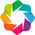

Loading BokehJS ...

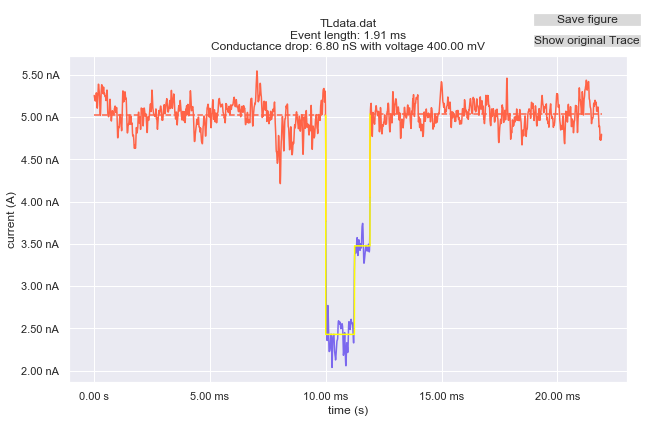

In [14]:
from Plotting import EventPlots

EventPlots.PlotEvent(Data.events[8],showCUSUM = True)

The two buttons (Save figure and show original Trace) don't work in Jupyter. Running them as stand alone does give you the option to save the figure or show the original trace. You can, however, show the original trace by calling the function *ShowEventInTrace*:

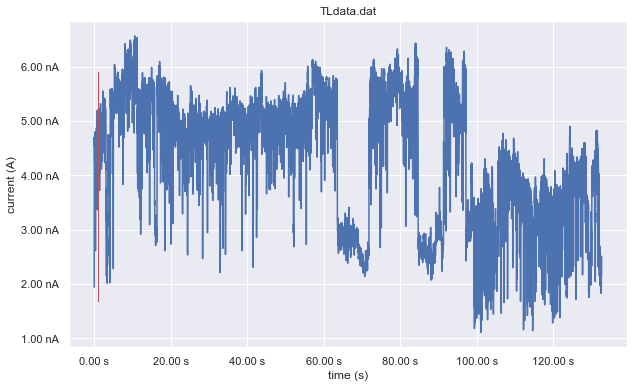

In [15]:
EventPlots.ShowEventInTrace(Data.events[8],lowPass=5e1)

Finally, all located events can be plotted in a conductance vs event time plot
For the Matplotlib version (better for standalone):
```Python
EventPlots.PlotG_tau(Data.events)
```
And for the Bokeh version (Better for Jupyter):
```Python
EventPlots.PlotGTau(Data)
```

In [16]:
from Plotting import EventPlots

EventPlots.PlotGTau(Data)

:AdjointLayout
   :Overlay
      .Points.Non_hyphen_minus_fitted :Points   [x,y]
      .Points.CUSUM                   :Points   [x,y]
      .Points.Impulse                 :Points   [x,y]
   :Overlay
      .Histogram.Non_hyphen_minus_fitted :Histogram   [y]   (y_count)
      .Histogram.CUSUM                   :Histogram   [y]   (y_count)
      .Histogram.Impulse                 :Histogram   [y]   (y_count)
   :Overlay
      .Histogram.Non_hyphen_minus_fitted :Histogram   [x]   (x_count)
      .Histogram.CUSUM                   :Histogram   [x]   (x_count)
      .Histogram.Impulse                 :Histogram   [x]   (x_count)

By default this will show the conductance at the y-axis:

In [17]:
EventPlots.PlotGTau(Data, showCurrent=True)

:AdjointLayout
   :Overlay
      .Points.Non_hyphen_minus_fitted :Points   [x,y]
      .Points.CUSUM                   :Points   [x,y]
      .Points.Impulse                 :Points   [x,y]
   :Overlay
      .Histogram.Non_hyphen_minus_fitted :Histogram   [y]   (y_count)
      .Histogram.CUSUM                   :Histogram   [y]   (y_count)
      .Histogram.Impulse                 :Histogram   [y]   (y_count)
   :Overlay
      .Histogram.Non_hyphen_minus_fitted :Histogram   [x]   (x_count)
      .Histogram.CUSUM                   :Histogram   [x]   (x_count)
      .Histogram.Impulse                 :Histogram   [x]   (x_count)

Additionally, the xlimits and ylimits can be set using xLim and yLim and the x-axis can be plotted logarithmically:

In [18]:
EventPlots.PlotGTau(Data, showCurrent=True,xLim=[1e-4,1e-1],showLog=True)

:AdjointLayout
   :Overlay
      .Points.Non_hyphen_minus_fitted :Points   [x,y]
      .Points.CUSUM                   :Points   [x,y]
      .Points.Impulse                 :Points   [x,y]
   :Overlay
      .Histogram.Non_hyphen_minus_fitted :Histogram   [y]   (y_count)
      .Histogram.CUSUM                   :Histogram   [y]   (y_count)
      .Histogram.Impulse                 :Histogram   [y]   (y_count)
   :Overlay
      .Histogram.Non_hyphen_minus_fitted :Histogram   [x]   (x_count)
      .Histogram.CUSUM                   :Histogram   [x]   (x_count)
      .Histogram.Impulse                 :Histogram   [x]   (x_count)